# **Classifiez automatiquement des biens de consommation**

Nous avons un projet e-commerce qui consiste à classer automatiquement les produits dans différentes catégories, soit à partir de leurs descriptions textuelles, soit à partir d'images.

Dans un premier temps, nous réalisons une étude de faisabilté basée sur les descriptions textuelles. Ensuite, nous évaluons la faisabilité de l'approche par image, avant de finaliser une méthode de classification optimale.

Nous convertissons les données textuelles en vecteurs numériques utilisables dans nos algorithmes. Ensuite, nous appliquerons une réduction de dimensionnalité avec un t-SNE. Si le t-SNE révèle des regroupements distincts, cela indique que nous sommes sur la bonne voie pour pouvoir classer les produits.





**Importer les bibliothèques nécessaires**

In [68]:
pip install numpy pandas scikit-learn

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import plotly.express as px
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import MissingIndicator, KNNImputer, SimpleImputer, IterativeImputer
from sklearn.linear_model import LinearRegression

In [70]:
# Afficher toutes les colonnes
pd.options.display.max_columns = None

**Importation fichier**

In [71]:
data_texte = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')

In [72]:
data_texte.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


# **Analyse exploratoire**

In [73]:
# Lecture des 5 premiere ligne
data_texte.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [74]:
# Lecture des 5 derniere lignes
data_texte.tail()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [75]:
# Obtenir la liste des colonnes
data_texte.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [76]:
# Le nombre de ligne et colonne
data_texte.shape

(1050, 15)

In [77]:
# Le nombre duplicata
data_texte.duplicated().sum()

0

In [78]:
# Info des des variable
data_texte.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [79]:
# les type de chaque variable
data_texte.dtypes

,0
uniq_id,object
crawl_timestamp,object
product_url,object
product_name,object
product_category_tree,object
pid,object
retail_price,float64
discounted_price,float64
image,object
is_FK_Advantage_product,bool


In [80]:
# le nombre de colonne int et objet
data_texte.dtypes.value_counts()

,count
object,12
float64,2
bool,1


In [81]:
data_texte.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


In [82]:
# Nombre de donnée manquante
data_texte.isnull().sum()

,0
uniq_id,0
crawl_timestamp,0
product_url,0
product_name,0
product_category_tree,0
pid,0
retail_price,1
discounted_price,1
image,0
is_FK_Advantage_product,0


In [83]:
# Pourcentage de donnée manquante
pourcentage = data_texte.isnull().mean() * 100
pourcentage

,0
uniq_id,0.000000
crawl_timestamp,0.000000
product_url,0.000000
product_name,0.000000
product_category_tree,0.000000
pid,0.000000
retail_price,0.095238
discounted_price,0.095238
image,0.000000
is_FK_Advantage_product,0.000000


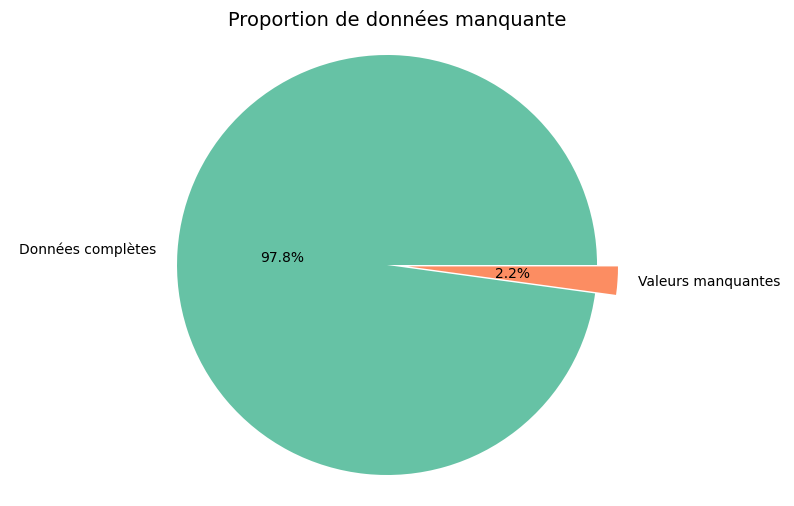

In [84]:
# proportion de donnee manquante
total_manquant = np.prod(data_texte.shape)
valeur_manquant = data_texte.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  # Explosion de la tranche de "Valeurs manquantes"
couleurs = ['#66c2a5', '#fc8d62']  # Couleurs des tranches

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  # Définition de la taille du graphique
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  # Création du graphique en secteurs
plt.title("Proportion de données manquante", fontsize=14)  # Ajout du titre
plt.axis("equal")  # graphique est un cercle
plt.show()  # Affichage du graphique

<Axes: >

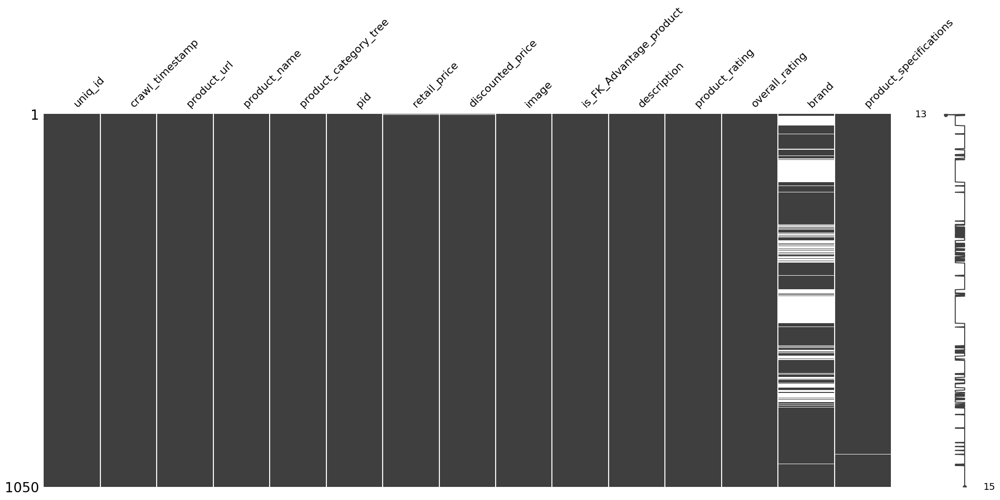

In [85]:
msn.matrix(data_texte)

In [86]:
# Vérifier les catégories uniques pour une colonne
data_texte['product_category_tree'].unique()

array(['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]',
       '["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]',
       '["Watches >> Wrist Watches >> Camerii Wrist Watches"]',
       '["Watches >> Wrist Watches >> T STAR Wrist Watches"]',
       '["Watches >> Wrist Watches >> Alfajr Wrist Watches"]',
       '["Watches >> Wrist Watches >> T

**Les categories de produits**

In [87]:

# Compter le nombre d'articles par catégorie de produit
data_texte['product_category_tree'].value_counts()

,count
product_category_tree,
"[""Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars""]",56
"[""Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs""]",26
"[""Watches >> Wrist Watches >> Maxima Wrist Watches""]",23
"[""Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs""]",22
"[""Home Furnishing >> Bath Linen >> Towels""]",19
...,...
"[""Home Decor & Festive Needs >> Showpieces >> Ethnic >> Infinity India Ethnic""]",1
"[""Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic""]",1
"[""Home Decor & Festive Needs >> Showpieces >> Ethnic >> Pg handicrafts Ethnic""]",1


In [88]:
data_texte[['Category_1', 'Category_2', 'Category_3']] = data_texte['product_category_tree'].str.strip('[]').str.replace('"', '').str.split('>>', n=3, expand=True)[[0, 1, 2]]


In [89]:
# Expore avec les categorie
data_texte.to_csv('data_texte_with_categories.csv', index=False, encoding='utf-8')


In [90]:
data_texte["Category_1"].nunique()

7

Nous constatons que nous avons 7 produit distinct dans la Category_1

<Axes: xlabel='Category_1'>

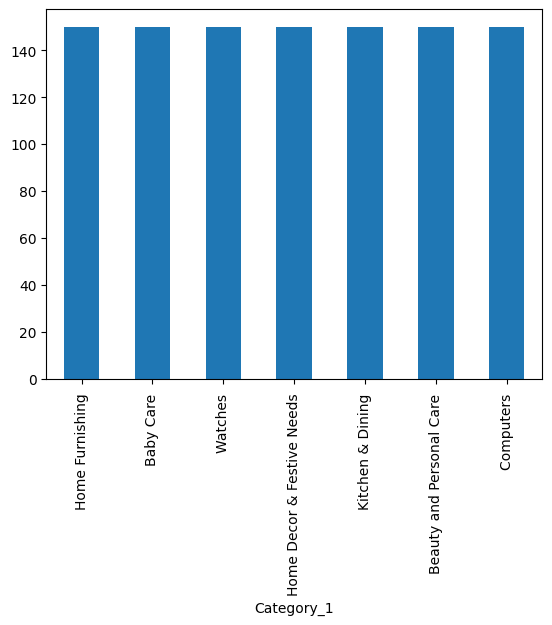

In [91]:
data_texte["Category_1"].value_counts().plot.bar()

In [92]:
data_texte["Category_2"].nunique()

63

Pour la categorie 2 on a 63 produit distinct

<Axes: xlabel='Category_2'>

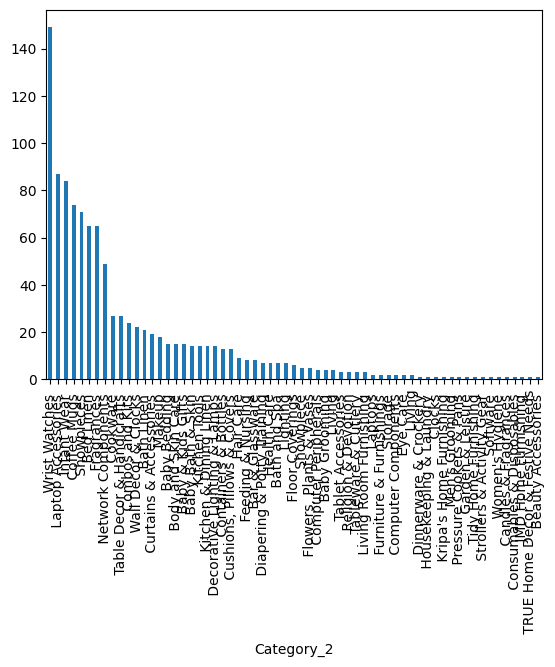

In [93]:

data_texte["Category_2"].value_counts().plot.bar()

In [94]:
data_texte["Category_3"].nunique()

246

pour la categorie3 on a 246

<Axes: xlabel='Category_3'>

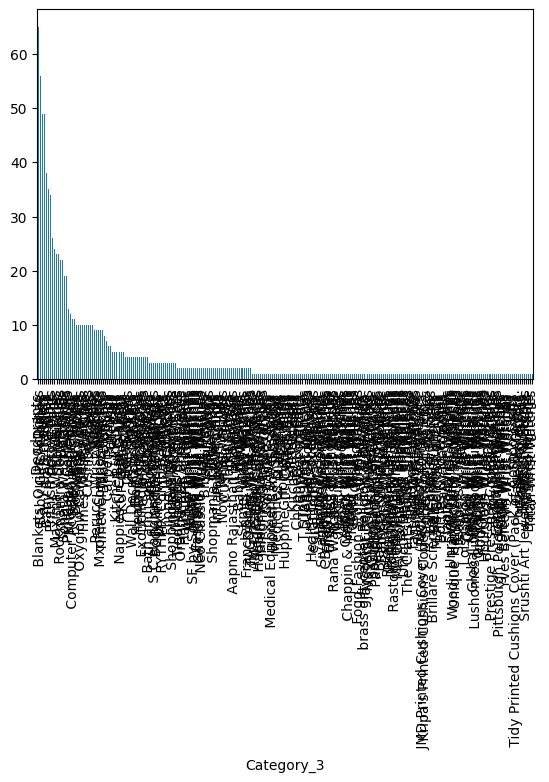

In [95]:
data_texte["Category_3"].value_counts().plot.bar()

**les mots les plus frequent de chaque categorie**

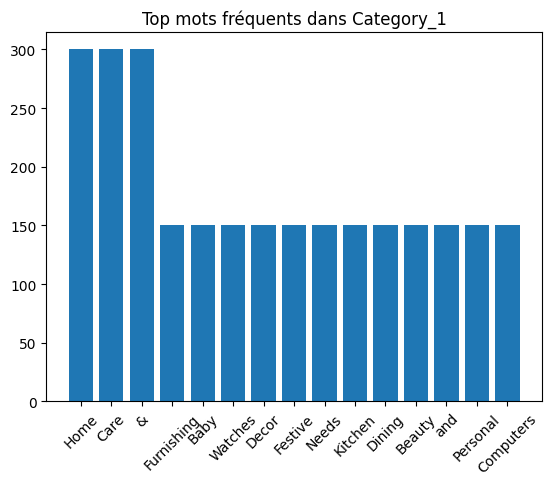

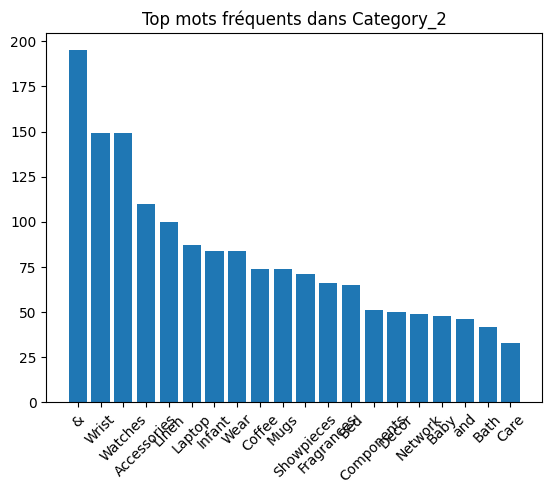

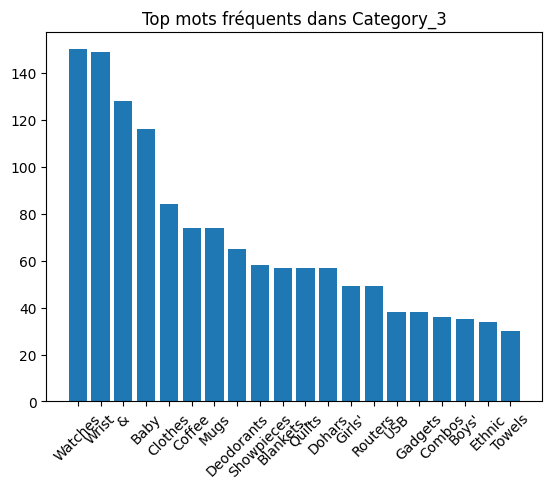

In [96]:
from collections import Counter


# Fonction pour compter la fréquence des mots dans une colonne donnée
def count_words_in_category(column):
    # Concatène tous les textes de la colonne en une seule chaîne de caractères
    text = ' '.join(column.dropna().astype(str))
    # Divise en mots (en gardant la casse et les caractères spéciaux)
    word_counts = Counter(text.split())
    # Renvoie les mots les plus fréquents
    return word_counts.most_common(20)

# Compte les mots pour chaque catégorie
words_category_1 = count_words_in_category(data_texte["Category_1"])
words_category_2 = count_words_in_category(data_texte["Category_2"])
words_category_3 = count_words_in_category(data_texte["Category_3"])

# Fonction pour visualiser les mots les plus fréquents
def plot_word_counts(word_counts, category_name):
    words, counts = zip(*word_counts)
    plt.bar(words, counts)
    plt.title(f'Top mots fréquents dans {category_name}')
    plt.xticks(rotation=45)
    plt.show()

# Affiche les résultats pour chaque catégorie
plot_word_counts(words_category_1, 'Category_1')
plot_word_counts(words_category_2, 'Category_2')
plot_word_counts(words_category_3, 'Category_3')


In [97]:
# Compter le nombre d'articles par marque
data_texte['brand'].value_counts()


,count
brand,
PRINT SHAPES,11
Lapguard,11
Lal Haveli,10
Raymond,8
Aroma Comfort,8
...,...
Rute,1
NAMS,1
JewelKraft Designs,1


**Analyse des prix**

In [98]:
# Calculer les statistiques des prix
data_texte[['retail_price', 'discounted_price']].describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


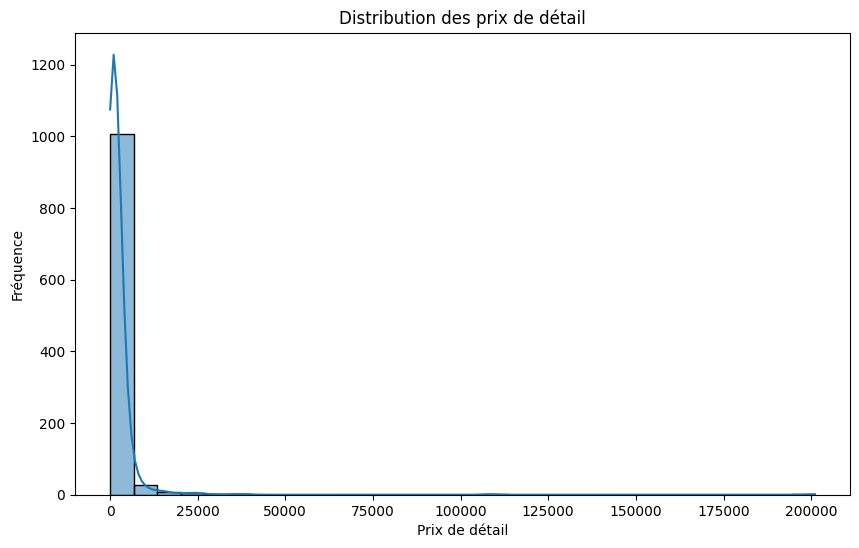

In [99]:
# Voir la distribution des prix de détail
plt.figure(figsize=(10, 6))
sns.histplot(data_texte['retail_price'].dropna(), bins=30, kde=True)
plt.title('Distribution des prix de détail')
plt.xlabel('Prix de détail')
plt.ylabel('Fréquence')
plt.show()

**les avis et notes des produits**

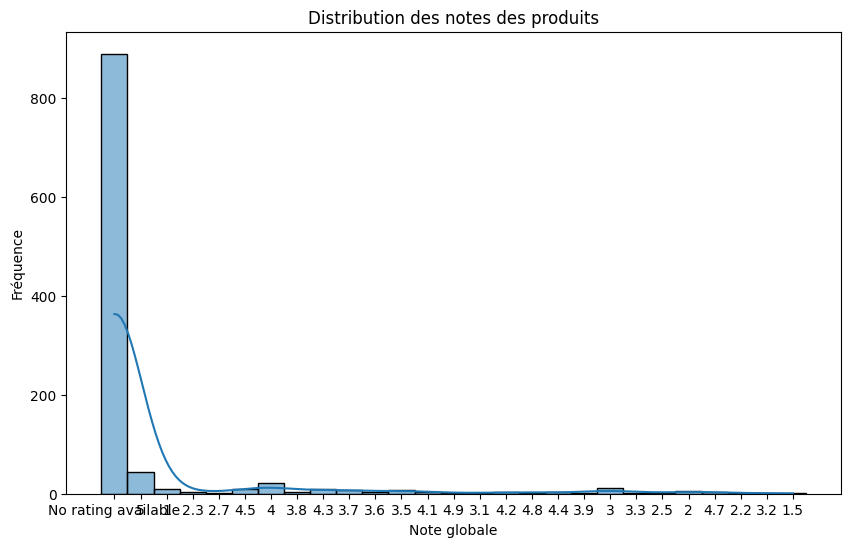

In [100]:
# Statistiques sur les avis
data_texte[['product_rating', 'overall_rating']].describe()

# Distribution des avis pour les produits
plt.figure(figsize=(10, 6))
sns.histplot(data_texte['overall_rating'].dropna(), bins=30, kde=True)
plt.title('Distribution des notes des produits')
plt.xlabel('Note globale')
plt.ylabel('Fréquence')
plt.show()


**une analyse sur la variable description**

In [101]:
colonne = ["uniq_id", "description"]
data_texte_analyse = data_texte[colonne]
data_texte_analyse

,uniq_id,description
0,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...
1,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...
2,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...
3,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...
4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...
...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker (Pack o...
1047,5912e037d12774bb73a2048f35a00009,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Buy Wallmantra Medium Vinyl Sticker Sticker fo...


In [102]:
# on peut determiner le nombre de caractere de different document
data_texte_analyse.description.apply(lambda i : len(i))

,description
0,1420
1,444
2,1258
3,858
4,1197
...,...
1045,2432
1046,1660
1047,262
1048,210


<Axes: ylabel='description'>

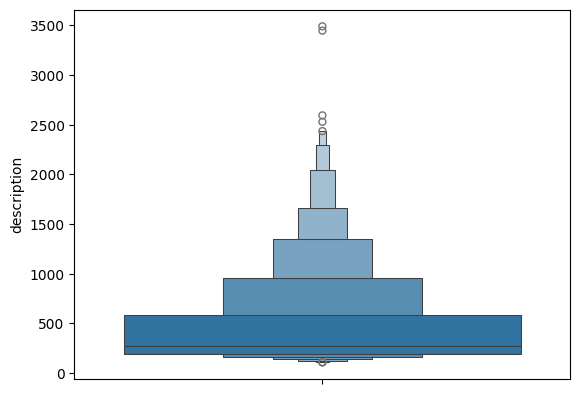

In [103]:
# Ou de cette maniere

nombre_caractere = data_texte_analyse.description.str.len()
sns.boxenplot(nombre_caractere)

On constate que la très grande majorité des description sont faite de 200 à 800 caractere

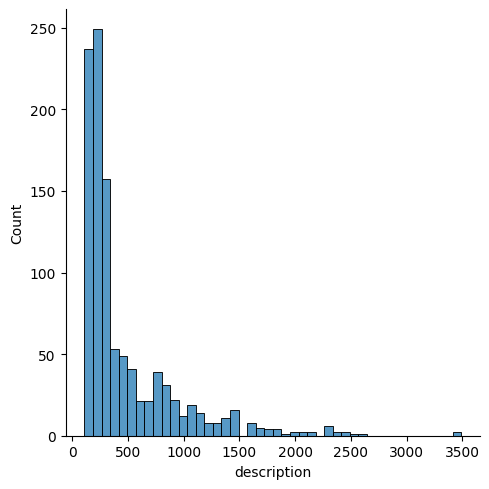

In [104]:
sns.displot(nombre_caractere)

In [105]:
# on peut ajouter la longueur du caractere de chaque ligne a notre dataframe
data_texte_analyse['longueur_texte']= nombre_caractere
data_texte_analyse.head()

<ipython-input-105-86f3b24f6df8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_texte_analyse['longueur_texte']= nombre_caractere


,uniq_id,description,longueur_texte
0,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...,1420
1,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...,444
2,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...,1258
3,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...,858
4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...,1197



Nous allons nous interesser a la colonne Description des produits.

*  Pretraitement des textes

*  Netoyage

*  Stemming

*  Lemmatization

*  Encodage du texte avec (Bag of Words, TfIdf etc.)

*  Méthodes de réduction de dimension sur le texte encodé et comparer les résultats avec les catégories réelles

**Exemple de chaque Prétraitement de Texte**

In [144]:

# Étape 1 : Mettre le texte en minuscule
data_texte_analyse.loc[:, 'lowercase_description'] = data_texte_analyse['description'].str.lower()

# Étape 2 : Supprimer les caractères spéciaux, chiffres et ponctuation
data_texte_analyse.loc[:, 'no_special_characters'] = data_texte_analyse['lowercase_description'].apply(
    lambda x: re.sub(r'[^a-z\s]', '', x)
)

# Étape 3 : Supprimer les stopwords
data_texte_analyse.loc[:, 'no_stopwords'] = data_texte_analyse['no_special_characters'].apply(
    lambda x: ' '.join([word for word in x.split() if word not in stop_words])
)

# Étape 4 : Stemming
data_texte_analyse.loc[:, 'stemmed'] = data_texte_analyse['no_stopwords'].apply(
    lambda x: ' '.join([stemmer.stem(word) for word in x.split()])
)

# Étape 5 : Lemmatisation
data_texte_analyse.loc[:, 'lemmatized'] = data_texte_analyse['stemmed'].apply(
    lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()])
)

# Afficher le résultat final avec chaque étape à côté de la description initiale
display(data_texte_analyse[['uniq_id', 'description', 'lowercase_description', 'no_special_characters', 'no_stopwords', 'stemmed', 'lemmatized']])

,uniq_id,description,lowercase_description,no_special_characters,no_stopwords,stemmed,lemmatized
0,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...,key features of elegance polyester multicolor ...,key features of elegance polyester multicolor ...,key features elegance polyester multicolor abs...,key featur eleg polyest multicolor abstract ey...,key featur eleg polyest multicolor abstract ey...
1,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...,specifications of sathiyas cotton bath towel (...,specifications of sathiyas cotton bath towel ...,specifications sathiyas cotton bath towel bath...,specif sathiya cotton bath towel bath towel re...,specif sathiya cotton bath towel bath towel re...
2,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...,key features of eurospa cotton terry face towe...,key features of eurospa cotton terry face towe...,key features eurospa cotton terry face towel s...,key featur eurospa cotton terri face towel set...,key featur eurospa cotton terri face towel set...
3,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...,key features of santosh royal fashion cotton p...,key features of santosh royal fashion cotton p...,key features santosh royal fashion cotton prin...,key featur santosh royal fashion cotton print ...,key featur santosh royal fashion cotton print ...
4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...,key features of jaipur print cotton floral kin...,key features of jaipur print cotton floral kin...,key features jaipur print cotton floral king s...,key featur jaipur print cotton floral king siz...,key featur jaipur print cotton floral king siz...
...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empower extra large self adhesive sticker...,oren empow extra larg self adhes sticker pack ...,oren empow extra larg self adhes sticker pack ...
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker (Pack o...,wallmantra large vinyl sticker sticker (pack o...,wallmantra large vinyl sticker sticker pack of...,wallmantra large vinyl sticker sticker pack pr...,wallmantra larg vinyl sticker sticker pack pri...,wallmantra larg vinyl sticker sticker pack pri...
1047,5912e037d12774bb73a2048f35a00009,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,buy uberlyfe extra large pigmented polyvinyl f...,buy uberlyfe extra large pigmented polyvinyl f...,buy uberlyfe extra large pigmented polyvinyl f...,buy uberlyf extra larg pigment polyvinyl film ...,buy uberlyf extra larg pigment polyvinyl film ...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,buy wallmantra medium vinyl sticker sticker fo...,buy wallmantra medium vinyl sticker sticker fo...,buy wallmantra medium vinyl sticker sticker rs...,buy wallmantra medium vinyl sticker sticker rs...,buy wallmantra medium vinyl sticker sticker r ...


**Appliquer tout les pretraitement sur description afin de structurer nos données**

In [107]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer

# télécharger les corpus nécessaires
nltk.download('stopwords')
nltk.download('wordnet')

# Charger les stopwords (mots vides) en anglais
stop_words = set(stopwords.words('english'))

# Initialiser le stemming et lemmatisation
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Fonction de nettoyage du texte
def clean_text(text):
    # 1. Mettre le texte en minuscule
    text = text.lower()

    # 2. Supprimer les caractères spéciaux, chiffres et ponctuation
    text = re.sub(r'[^a-z\s]', '', text)

    # 3. Supprimer les stopwords
    words = text.split()
    words = [word for word in words if word not in stop_words]

    # 4. Stemming
    stemmed_words = [stemmer.stem(word) for word in words]

    # 5. Lemmatisation
    lemmatized_words = [lemmatizer.lemmatize(word) for word in stemmed_words]

    # Rejoindre les mots traités
    return ' '.join(lemmatized_words)

# Appliquer le prétraitement à la colonne 'description'
data_texte['cleaned_description'] = data_texte['description'].apply(clean_text)

# Vérification du résultat
display(data_texte[['uniq_id', 'description', 'cleaned_description',]])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,uniq_id,description,cleaned_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Key Features of Elegance Polyester Multicolor ...,key featur eleg polyest multicolor abstract ey...
1,7b72c92c2f6c40268628ec5f14c6d590,Specifications of Sathiyas Cotton Bath Towel (...,specif sathiya cotton bath towel bath towel re...
2,64d5d4a258243731dc7bbb1eef49ad74,Key Features of Eurospa Cotton Terry Face Towe...,key featur eurospa cotton terri face towel set...
3,d4684dcdc759dd9cdf41504698d737d8,Key Features of SANTOSH ROYAL FASHION Cotton P...,key featur santosh royal fashion cotton print ...
4,6325b6870c54cd47be6ebfbffa620ec7,Key Features of Jaipur Print Cotton Floral Kin...,key featur jaipur print cotton floral king siz...
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker...,oren empow extra larg self adhes sticker pack ...
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker (Pack o...,wallmantra larg vinyl sticker sticker pack pri...
1047,5912e037d12774bb73a2048f35a00009,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,buy uberlyf extra larg pigment polyvinyl film ...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,buy wallmantra medium vinyl sticker sticker r ...


In [108]:
# Exporter le DataFrame avec la colonne nettoyée en fichier CSV
data_texte[['uniq_id', 'description', 'cleaned_description']].to_csv('data_texte_cleaned.csv', index=False, encoding='utf-8')


In [109]:
# le nombre de caractere apres traitement

nombre_caractere_apres = data_texte.cleaned_description.str.len()
# on peut ajouter la longueur du caractere de chaque ligne a notre dataframe
data_texte['long_apres_traitement']= nombre_caractere_apres
data_texte

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,Category_1,Category_2,Category_3,cleaned_description,long_apres_traitement
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,key featur eleg polyest multicolor abstract ey...,989
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,specif sathiya cotton bath towel bath towel re...,364
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,key featur eurospa cotton terri face towel set...,897
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets,key featur santosh royal fashion cotton print ...,691
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets,key featur jaipur print cotton floral king siz...,903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ...",Baby Care,Baby & Kids Gifts,Stickers,oren empow extra larg self adhes sticker pack ...,1333
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""

In [110]:
data_texte_analyse['longueur_texte'].describe()

,longueur_texte
count,1050.000000
mean,473.820952
std,457.910422
min,109.000000
25%,192.000000
50%,278.000000
75%,588.250000
max,3490.000000


In [111]:
data_texte['long_apres_traitement'].describe()

,long_apres_traitement
count,1050.000000
mean,324.009524
std,300.156251
min,61.000000
25%,131.250000
50%,200.000000
75%,423.000000
max,2330.000000


# **Etude de faisabilité**

1. countvectorizer

2. tfdf vectorizer

3. Use

4. Word2vec

5. Bert

## **countvectorizer**

In [112]:
from sklearn.feature_extraction.text import CountVectorizer

In [113]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(data_texte['cleaned_description'])

In [114]:
feature_names = vectorizer.get_feature_names_out()
feature_names

array(['aa', 'aaa', 'aapno', ..., 'zoom', 'zora', 'zyxel'], dtype=object)

In [115]:

data_encoded = pd.DataFrame(X.toarray(), columns=feature_names)
data_encoded

aa  aaa  aapno  aari  aarika  abil  abklgrngrngrn  abklplplpnk  \
0      0    0      0     0       0     0              0            0   
1      0    0      0     0       0     0              0            0   
2      0    0      0     0       0     0              0            0   
3      0    0      0     0       0     0              0            0   
4      0    0      0     0       0     0              0            0   
...   ..  ...    ...   ...     ...   ...            ...          ...   
1045   0    0      0     0       0     0              0            0   
1046   0    0      0     0       0     0              0            0   
1047   0    0      0     0       0     0              0            0   
1048   0    0      0     0       0     0              0            0   
1049   0    0      0     0       0     0              0            0   

      abklplpnkpnk  abl  abod  abras  abroad  absolut  absorb  abstract  \
0                0    0     0      0       0        0       0         4   
1                0    0     0      0       0        0       0         0   
2                0    0     0      0       0        0       1         0   
3                0    0     0      0       0        0       0         0   
4                0    0     0      0       0        0       0         0   
...            ...  ...   ...    ...     ...      ...     ...       ...   
1045             0    0     0      0       0        0       0         0   
1046             0    0     0      0       0        0       0         0   
1047             0    0     0      0       0        0       0         0   
1048             0    0     0      0       0        0       0         0   
1049             0    0     0      0       0        0       0         0   

      abstrct  ac  accent  access  accessori  accid  accident  accommod  \
0           0   0       0       0          0      0         0         0   
1           0   0       0       0          0      0         0         0   
2           0   0       0       0          0      0         0         0   
3           0   0       0       0          0      0         0         0   
4           0   0       0       0          0      0         0         0   
...       ...  ..     ...     ...        ...    ...       ...       ...   
1045        0   0       0       0          0      0         0         0   
1046        0   0       0       0          0      0         0         0   
1047        0   0       0       0          0      0         0         0   
1048        0   0       0       0          0      0         0         0   
1049        0   0       0       0          0      0         0         0   

      accomplish  accord  acer  ach  aci  acid  acn  across  acryl  act  \
0              0       0     0    0    0     0    0       0      0    0   
1              0       0     0    0    0     0    0       0      0    0   
2              0       0     0    0    0     0    0       0      0    0   
3              0       0     0    0    0     0    0       0      0    0   
4              0       0     0    0    0     0    0       0      0    0   
...          ...     ...   ...  ...  ...   ...  ...     ...    ...  ...   
1045           0       0     0    0    0     0    0       0      0    0   
1046           0       0     0    0    0     0    0       0      0    0   
1047           0       0     0    0    0     0    0       0      0    0   
1048           0       0     0    0    0     0    0       0      0    0   
1049           0       0     0    0    0     0    0       0      0    0   

      activ  actu  actual  actx  ad  adaa  adapt  adaptor  add  addarkorang  \
0         0     0       0     0   0     0      0        0    0            0   
1         0     0       0     0   0     0      0        0    0            0   
2         0     0       0     0   0     0      0        0    0            0   
3         0     0       0     0   0     0      0        0    0            0   
4         0     0       0     0   0     0  

In [116]:
#(fréquence moyenne) de chaque mot sur l'ensemble des documents
data_encoded.mean().sort_values(ascending=False).head(15)

,0
product,0.825714
free,0.582857
buy,0.553333
replac,0.542857
ship,0.541905
deliveri,0.540000
cm,0.540000
cash,0.537143
genuin,0.537143
price,0.532381


In [117]:
data_encoded.shape

(1050, 4553)

Comme il y'a des mots qui apparait dans data_encoded qui ne sert pas nous allons
réduire la dimensionnalité de notre matrice de termes encodés ( data_encoded) tout en conservant 99 % de la variance

In [118]:
from sklearn.decomposition import PCA


# Créer un modèle PCA avec 99% de la variance expliquée
pca = PCA(n_components=0.99)

# Appliquer le PCA sur les données encodées
data_reduced = pca.fit_transform(data_encoded)

# Convertir le résultat en DataFrame pour une meilleure interprétation
data_reduced = pd.DataFrame(data_reduced)


# Afficher les nouvelles dimensions
print(f'Anciennes dimensions: {data_encoded.shape}')
print(f'Nouvelles dimensions après PCA: {data_reduced.shape}')

Anciennes dimensions: (1050, 4553)
Nouvelles dimensions après PCA: (1050, 576)


In [119]:
data_reduced

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575
0,4.666455,-1.130791,-3.377791,2.906103,0.339954,-1.107651,-1.221768,2.701189,0.315984,0.660853,-0.446509,-2.122893,-1.949360,0.293715,-0.667408,-0.157164,1.396947,0.192922,-0.094112,0.690280,6.704454,0.251384,-0.358452,4.963253,0.700601,-0.837354,-1.190789,0.871101,-0.802235,-2.179509,-2.823883,-5.070878,0.039829,-1.752725,-3.079838,-2.940645,-0.942782,0.848741,-0.540627,2.589857,-1.637845,0.378424,-2.708277,2.450695,3.736947,-0.326215,-1.758872,-1.471761,-1.393664,-1.315122,-0.021347,0.461928,1.965635,2.463052,-1.087909,-1.207630,0.980172,-3.219395,-1.499902,-1.018269,-0.063182,0.740668,-0.335193,-0.939289,-2.052010,1.791295,-2.385950,-0.920472,-1.357012,-1.367779,-0.351449,-1.468641,1.144612,0.411456,0.122499,-0.238127,-1.771766,0.172531,0.086981,0.709731,0.376543,-0.935705,-0.657307,-0.151234,0.694256,0.731328,0.525675,0.736615,0.014068,1.967584,-1.237235,-0.729900,0.302814,0.196248,-0.464888,0.964094,1.162922,0.076854,-0.837410,0.051555,-0.041834,0.460757,0.847226,-1.276752,-0.722675,-0.802155,0.312013,-0.056605,1.151290,-0.330913,-0.496727,-0.230947,0.086112,-1.466450,0.616270,-0.356436,0.875462,0.930717,-0.411996,0.334839,-0.472686,-1.101828,-0.290780,0.129804,0.029059,0.115734,0.010605,1.427782,0.712157,0.497317,0.670186,-0.060067,-0.633525,0.206354,-1.085778,0.481529,-1.255781,0.077005,0.326092,1.567040,1.055836,-0.520399,0.776199,0.476023,-0.428644,-0.134001,-0.372693,-0.481851,-1.898332,-1.098783,-0.614693,-0.056741,-0.412657,-0.040777,0.292764,-1.731249,0.957844,0.201948,-1.463928,-0.240887,-0.414087,0.086811,1.129998,-1.161341,-0.388695,0.550753,-0.056903,-0.160277,0.090181,-0.123649,0.758309,0.801711,-0.783826,0.111155,-0.795926,-0.833285,-0.154848,1.481540,0.449617,-0.364047,0.700130,0.545887,-0.109116,-0.453290,-1.883456,0.207522,-0.251063,-0.814776,-0.548846

In [120]:
# La TSNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
tsne = TSNE(n_components=2, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(data_reduced)
X_tsne

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


array([[ 18.440058, -28.757538],
       [-14.089687, -13.098842],
       [-16.130457,  -8.495944],
       ...,
       [ 27.449581,  13.834916],
       [ 26.535406,  10.91835 ],
       [ 26.869797,  12.86685 ]], dtype=float32)

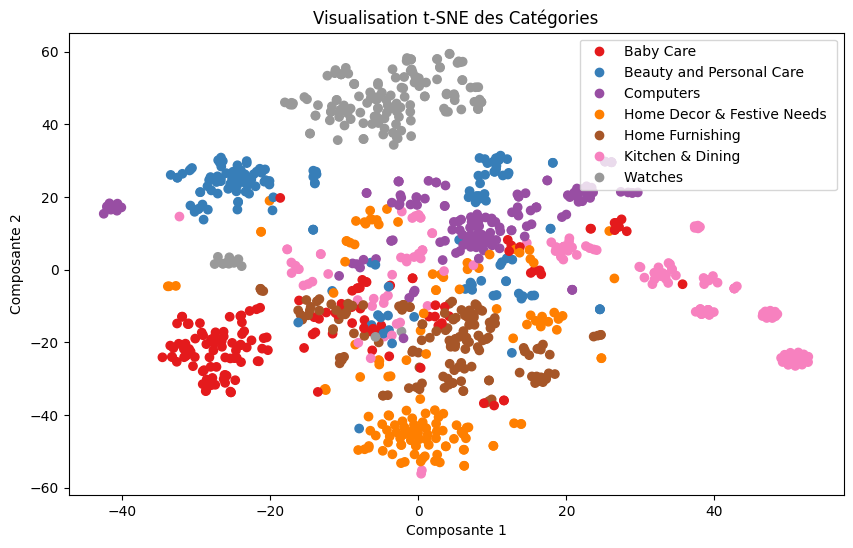

In [121]:
# Création de l'encodeur et transformation des catégories
labelencoder = LabelEncoder()
categorie = labelencoder.fit_transform(data_texte['Category_1'])

# Création du scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='Set1')

# Création de la légende
handles, labels = scatter.legend_elements()
plt.legend(handles, labelencoder.classes_)

# Ajouter des titres et des étiquettes si nécessaire
plt.title('Visualisation t-SNE des Catégories')
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Affichage du plot
plt.show()

 Nous allons maintenant utiliser les données issues du t-SNE, c'est-à-dire X_tsne0 et X_tsne1, pour effectuer un clustering avec KMeans en 7 catégories (k=7), sans utiliser les variables initiales ( data_reduced). Ensuite, nous calculons l'ARI (Adjusted Rand Index) pour comparer les résultats du t-SNE initial avec ceux du clustering.

L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : 0.39357484957661415


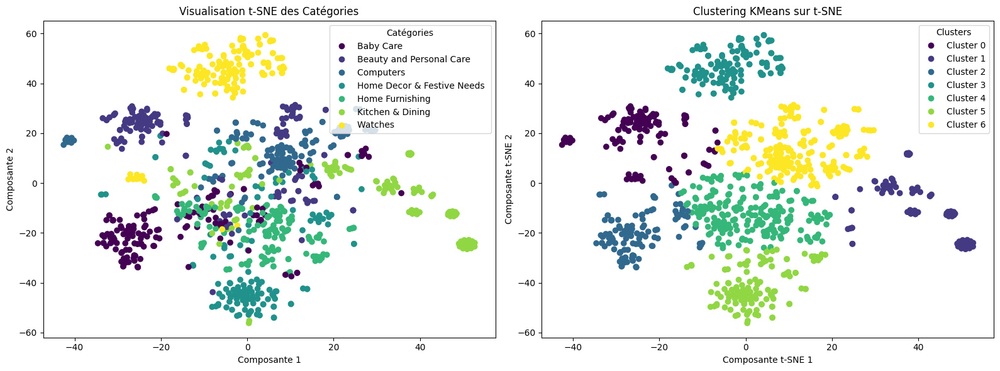

In [122]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score


# Appliquer KMeans sur les données t-SNE
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_labels = kmeans.fit_predict(X_tsne)

# Créer une figure avec 2 sous-graphiques côte à côte
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# 1ère visualisation : t-SNE avec les catégories d'origine
scatter_1 = ax[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='viridis')
ax[0].set_title('Visualisation t-SNE des Catégories')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
# Ajouter une légende pour les catégories d'origine
handles_1, labels_1 = scatter_1.legend_elements()
ax[0].legend(handles_1, labelencoder.classes_, title="Catégories")

# 2ème visualisation : Clustering KMeans sur t-SNE
scatter_2 = ax[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
ax[1].set_title('Clustering KMeans sur t-SNE')
ax[1].set_xlabel('Composante t-SNE 1')
ax[1].set_ylabel('Composante t-SNE 2')
# Ajouter une légende pour les clusters
handles_2, labels_2 = scatter_2.legend_elements()
ax[1].legend(handles_2, [f'Cluster {i}' for i in range(7)], title="Clusters")

# Calculer l'ARI entre les étiquettes d'origine (categorie) et les clusters KMeans
ari = adjusted_rand_score(categorie, kmeans_labels)
print(f"L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : {ari}")

# Afficher les deux graphiques côte à côte
plt.tight_layout()
plt.show()

## **TF-IDF Vectorizer**

In [123]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [124]:
# Utiliser TfidfVectorizer sur la colonne nettoyée
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(data_texte['cleaned_description'])

In [125]:
# Transformer en DataFrame
feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()
data_encoded_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=feature_names_tfidf)
data_encoded_tfidf

aa  aaa  aapno  aari  aarika  abil  abklgrngrngrn  abklplplpnk  \
0     0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
1     0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
2     0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
3     0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
4     0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
...   ...  ...    ...   ...     ...   ...            ...          ...   
1045  0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
1046  0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
1047  0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
1048  0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   
1049  0.0  0.0    0.0   0.0     0.0   0.0            0.0          0.0   

      abklplpnkpnk  abl  abod  abras  abroad  absolut    absorb  abstract  \
0              0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.175932   
1              0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
2              0.0  0.0   0.0    0.0     0.0      0.0  0.054279  0.000000   
3              0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
4              0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
...            ...  ...   ...    ...     ...      ...       ...       ...   
1045           0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
1046           0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
1047           0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
1048           0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   
1049           0.0  0.0   0.0    0.0     0.0      0.0  0.000000  0.000000   

      abstrct   ac  accent  access  accessori  accid  accident  accommod  \
0         0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
1         0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
2         0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
3         0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
4         0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
...       ...  ...     ...     ...        ...    ...       ...       ...   
1045      0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
1046      0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
1047      0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
1048      0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   
1049      0.0  0.0     0.0     0.0        0.0    0.0       0.0       0.0   

      accomplish  accord  acer  ach  aci  acid  acn  across  acryl  act  \
0            0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
1            0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
2            0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
3            0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
4            0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
...          ...     ...   ...  ...  ...   ...  ...     ...    ...  ...   
1045         0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
1046         0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
1047         0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
1048         0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   
1049         0.0     0.0   0.0  0.0  0.0   0.0  0.0     0.0    0.0  0.0   

      activ  actu  actual  actx   ad  adaa  adapt  adaptor  add  addarkorang  \
0       0.0   0.0     0.0   0.0  0.0   0.0    0.0      0.0  0.0          0.0   
1       0.0   0.0     0.0   0.0  0.0   0.0    0.0      0.0  0.0          0.0   
2       0.0   0.0     0.0   0.0  0.0   0.0    0.0      0.0  0.0          0.0   
3       0.0   0.0     0.0   0.0  0.0   0.0    0.0      0.0  0.0        

Créer un modèle PCA avec 99% de la variance expliquée

In [126]:
# Appliquer le PCA sur les données encodées
data_reduced_tfidf = pca.fit_transform(data_encoded_tfidf)

# Convertir le résultat en DataFrame pour une meilleure interprétation
data_reduced_tfidf = pd.DataFrame(data_reduced_tfidf)


# Afficher les nouvelles dimensions
print(f'Anciennes dimensions: {data_encoded_tfidf.shape}')
print(f'Nouvelles dimensions après PCA: {data_reduced_tfidf.shape}')

Anciennes dimensions: (1050, 4553)
Nouvelles dimensions après PCA: (1050, 822)


In [127]:
# La TSNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
tsne = TSNE(n_components=2, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(data_reduced_tfidf)
X_tsne

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


array([[-22.732586 , -12.284918 ],
       [  6.0640373,   5.846692 ],
       [  8.361379 ,   7.9637337],
       ...,
       [ -2.1911972,  37.55933  ],
       [ -3.6103768,  35.398853 ],
       [ -2.409794 ,  36.869255 ]], dtype=float32)

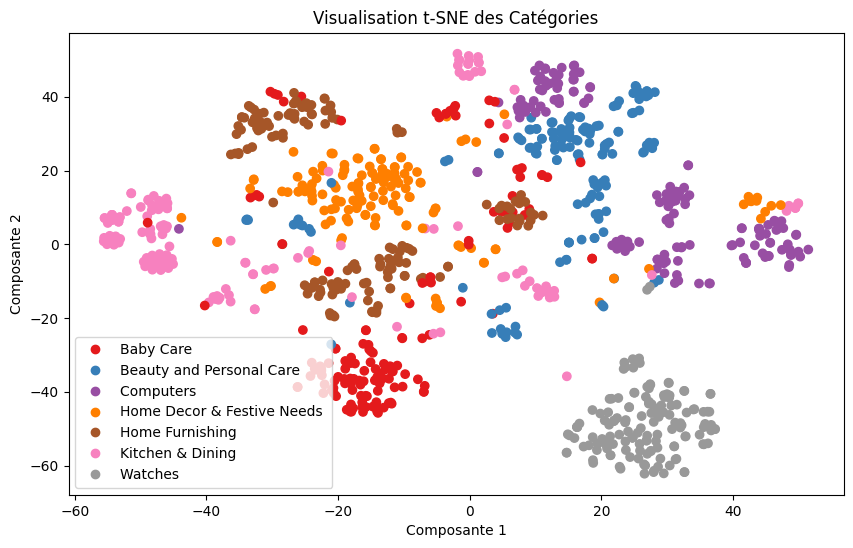

In [128]:
# Création de l'encodeur et transformation des catégories
labelencoder = LabelEncoder()
categorie = labelencoder.fit_transform(data_texte['Category_1'])

# Création du scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='Set1')

# Création de la légende
handles, labels = scatter.legend_elements()
plt.legend(handles, labelencoder.classes_)

# Ajouter des titres et des étiquettes si nécessaire
plt.title('Visualisation t-SNE des Catégories')
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Affichage du plot
plt.show()

L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : 0.43762485699732656


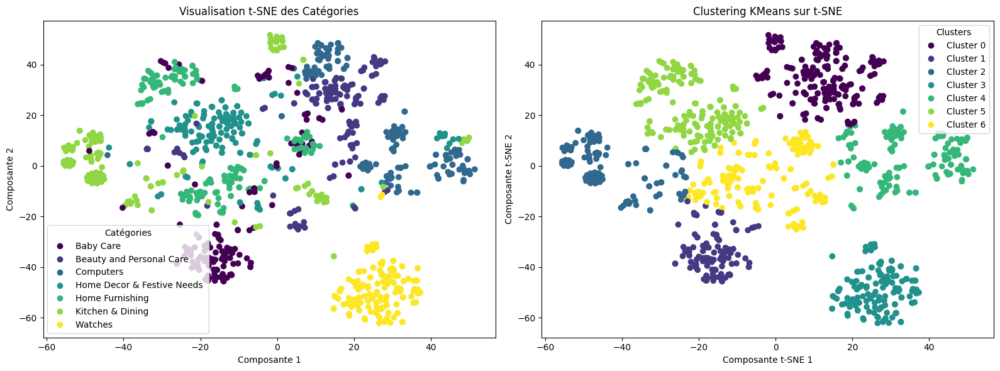

In [129]:
# Appliquer KMeans sur les données t-SNE
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_labels = kmeans.fit_predict(X_tsne)

# Créer une figure avec 2 sous-graphiques côte à côte
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# 1ère visualisation : t-SNE avec les catégories d'origine
scatter_1 = ax[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='viridis')
ax[0].set_title('Visualisation t-SNE des Catégories')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
# Ajouter une légende pour les catégories d'origine
handles_1, labels_1 = scatter_1.legend_elements()
ax[0].legend(handles_1, labelencoder.classes_, title="Catégories")

# 2ème visualisation : Clustering KMeans sur t-SNE
scatter_2 = ax[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
ax[1].set_title('Clustering KMeans sur t-SNE')
ax[1].set_xlabel('Composante t-SNE 1')
ax[1].set_ylabel('Composante t-SNE 2')
# Ajouter une légende pour les clusters
handles_2, labels_2 = scatter_2.legend_elements()
ax[1].legend(handles_2, [f'Cluster {i}' for i in range(7)], title="Clusters")

# Calculer l'ARI entre les étiquettes d'origine (categorie) et les clusters KMeans
ari = adjusted_rand_score(categorie, kmeans_labels)
print(f"L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : {ari}")

# Afficher les deux graphiques côte à côte
plt.tight_layout()
plt.show()

**TF-IDF Vectorizer** donne les meilleurs résultats que **CountVectorizer** dans ce cas.

## **Universal Sentence Encoder (USE)**

In [130]:
import tensorflow_hub as hub
import tensorflow as tf
import pandas as pd

# Charger le modèle Universal Sentence Encoder depuis TensorFlow Hub
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")


sentences = data_texte['description'].tolist()  # Convertir en liste

# Utiliser USE pour encoder les phrases
sentence_embeddings = embed(sentences)

# Transformer les embeddings en DataFrame
data_encoded_use = pd.DataFrame(sentence_embeddings.numpy())

# Afficher les embeddings
data_encoded_use

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511
0,-0.056370,-0.023049,0.017895,0.047665,0.027024,0.050614,-0.051162,0.058017,-0.023607,-0.009930,-0.053056,-0.009590,-0.000169,-0.059450,0.044575,0.053633,0.053813,0.005478,0.058961,0.044570,-0.052364,-0.053986,0.019671,-0.052013,-0.041563,-0.031890,0.051501,0.056835,0.058303,0.053073,0.059815,0.039486,0.000077,-0.050930,0.029863,-0.025025,0.052171,0.059705,-0.049919,-0.056532,-0.037939,-0.050668,0.059343,0.000316,-0.029419,-0.059600,-0.018150,0.019121,0.045955,-0.052096,-0.046036,0.053254,-0.059375,-0.043528,-0.021222,0.050989,0.037193,0.047584,0.037796,-0.058662,-0.044667,-0.058483,0.037199,0.043086,0.057611,0.016631,0.012548,-0.000321,0.048639,0.057418,-0.007755,0.058374,0.032860,0.058351,0.038271,0.025358,-0.003633,-0.009429,0.056318,-0.049437,0.056554,0.038459,0.058238,-0.018709,-0.014925,0.051778,-0.058331,0.050074,0.018506,0.002626,0.000728,-0.047244,0.050391,-0.009465,0.053877,0.009752,-0.016097,0.052449,0.059700,0.001007,0.059298,-0.049585,0.047210,-0.016819,0.052962,0.051500,-0.022209,-0.055506,0.042311,0.057708,-0.027929,-0.024558,0.056177,-0.051458,0.033855,-0.037327,-0.059266,0.059655,0.053136,0.020795,-0.042204,0.057244,0.057065,-0.051103,-0.034904,0.038321,-0.057470,-0.059177,-0.042586,0.058817,0.026226,0.000508,0.056089,-0.018525,-0.023344,0.053151,0.008419,-0.042765,-0.059562,0.059044,-0.059562,0.059815,-0.058458,-0.020927,-0.038552,-0.057822,0.055901,0.057258,0.054413,0.017180,-0.012292,-0.059077,-0.058107,-0.024781,-0.028834,0.040615,-0.022141,0.037575,-0.036718,-0.056637,-0.022435,-0.018263,0.016490,0.059375,0.007334,0.034882,-0.018346,0.013031,-0.048536,0.029284,-0.038767,0.057346,0.053466,-0.046860,-0.033325,0.011815,0.013588,0.019249,0.059664,-0.034563,-0.059238,-0.028776,-0.032060,-0.040362,-0.057081,0.041284,-0.025516,0.000982,0.056775,-0.039733,0.055130,0.015821,-0.042005,-0.059810,-0.045500,-0.057208,-0.042760,-0.050561,-0.007024,-0.005668,-0.046761,-0.054767,0.058320,-0.052945,0.002411,-0.029535,-0.006063,-0.038738,0.000722,0.027749,0.039727,0.057561,-0.009338,0.059289,-0.026506,-0.056218,0.037386,

In [131]:
# La TSNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
tsne = TSNE(n_components=2, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(data_encoded_use)
X_tsne

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


array([[-30.333263 , -19.267475 ],
       [-22.007666 , -26.862368 ],
       [-22.259565 , -27.358747 ],
       ...,
       [  4.3782287,  13.508889 ],
       [  3.6905634,  11.879485 ],
       [  4.1297245,  12.675277 ]], dtype=float32)

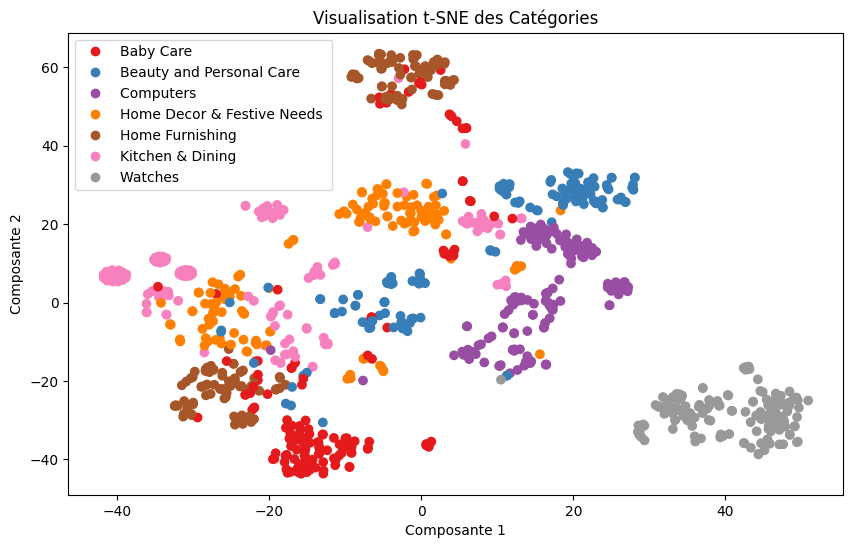

In [132]:
# Création de l'encodeur et transformation des catégories
labelencoder = LabelEncoder()
categorie = labelencoder.fit_transform(data_texte['Category_1'])

# Création du scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='Set1')

# Création de la légende
handles, labels = scatter.legend_elements()
plt.legend(handles, labelencoder.classes_)

# Ajouter des titres et des étiquettes si nécessaire
plt.title('Visualisation t-SNE des Catégories')
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Affichage du plot
plt.show()

L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : 0.40367730964733584


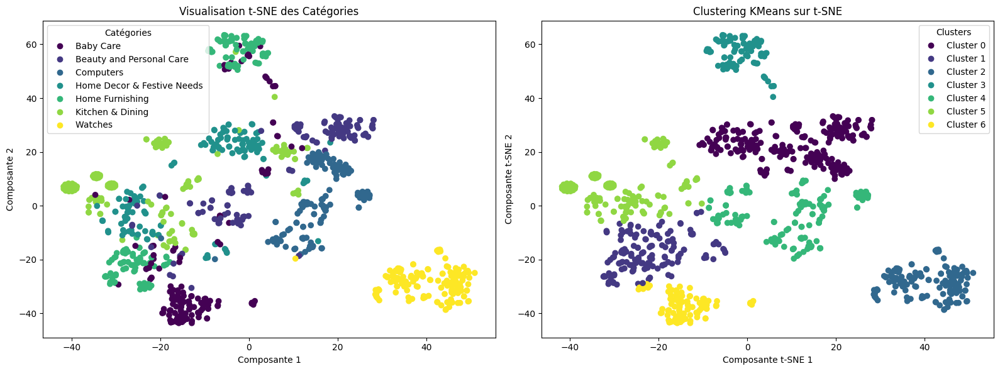

In [133]:
# Appliquer KMeans sur les données t-SNE
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_labels = kmeans.fit_predict(X_tsne)

# Créer une figure avec 2 sous-graphiques côte à côte
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# 1ère visualisation : t-SNE avec les catégories d'origine
scatter_1 = ax[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='viridis')
ax[0].set_title('Visualisation t-SNE des Catégories')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
# Ajouter une légende pour les catégories d'origine
handles_1, labels_1 = scatter_1.legend_elements()
ax[0].legend(handles_1, labelencoder.classes_, title="Catégories")

# 2ème visualisation : Clustering KMeans sur t-SNE
scatter_2 = ax[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
ax[1].set_title('Clustering KMeans sur t-SNE')
ax[1].set_xlabel('Composante t-SNE 1')
ax[1].set_ylabel('Composante t-SNE 2')
# Ajouter une légende pour les clusters
handles_2, labels_2 = scatter_2.legend_elements()
ax[1].legend(handles_2, [f'Cluster {i}' for i in range(7)], title="Clusters")

# Calculer l'ARI entre les étiquettes d'origine (categorie) et les clusters KMeans
ari = adjusted_rand_score(categorie, kmeans_labels)
print(f"L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : {ari}")

# Afficher les deux graphiques côte à côte
plt.tight_layout()
plt.show()

## **Word2vec**

In [134]:
from nltk.stem import PorterStemmer, WordNetLemmatizer
from gensim.models import Word2Vec


# Création du modèle Word2Vec
word2vec_model = Word2Vec(sentences=data_texte['cleaned_description'], vector_size=100, window=5, min_count=2, workers=4, sg=0)


# Transformation des phrases en vecteurs
def get_sentence_vector(sentence, model):
    # Moyenne des vecteurs de chaque mot dans une phrase
    vectors = [model.wv[word] for word in sentence if word in model.wv]
    if vectors:
        return np.mean(vectors, axis=0)
    else:
        # Retourne un vecteur nul si aucun mot de la phrase n'est dans le vocabulaire
        return np.zeros(model.vector_size)

# Appliquer la transformation des phrases en vecteurs
data_texte['sentence_vector'] = data_texte['cleaned_description'].apply(lambda x: get_sentence_vector(x, word2vec_model))

# Convertir en DataFrame pour un traitement ultérieur
data_encoded_word2vec = pd.DataFrame(data_texte['sentence_vector'].tolist(), index=data_texte.index)

# Afficher le résultat
data_encoded_word2vec

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,-0.110977,0.107187,0.058535,0.138897,-0.018875,-0.105083,0.087122,0.167914,-0.159202,-0.152246,0.079375,-0.147708,-0.039957,0.026389,0.026916,0.008459,0.099301,0.040954,-0.107532,-0.173618,0.023375,0.048504,0.206836,-0.016081,0.012266,0.058498,-0.082198,0.058540,-0.023475,0.018059,0.110137,-0.124494,0.071807,-0.096509,-0.043590,0.102053,0.151978,0.040680,-0.022053,0.012184,0.126892,-0.077967,-0.149317,0.051468,0.027846,0.036603,-0.101871,-0.000272,0.035420,0.012211,0.023968,-0.124265,-0.039149,0.022244,-0.102385,0.000213,0.103000,-0.077250,-0.005541,0.011844,-0.039921,0.017879,0.167907,-0.037781,-0.042571,0.133679,-0.000352,0.125113,-0.101719,-0.014198,0.002517,0.103286,0.104034,0.069728,0.040202,0.014494,-0.010866,0.021071,-0.023160,-0.078163,-0.123736,-0.080008,0.093153,0.007872,-0.054014,-0.071419,0.080977,-0.055487,0.013061,0.012711,0.057988,0.076947,-0.003765,-0.002341,0.174165,0.049111,0.068095,-0.051267,0.012882,0.055320
1,-0.077818,0.091402,0.063807,0.141460,-0.019959,-0.104051,0.095990,0.162062,-0.166197,-0.162978,0.076581,-0.185000,-0.025396,0.052035,0.016522,0.005888,0.109800,0.045634,-0.082249,-0.221325,0.049596,0.074073,0.188365,-0.033758,0.017466,0.062677,-0.092374,0.040146,-0.028427,-0.000773,0.100179,-0.117215,0.057492,-0.088479,-0.069626,0.113180,0.136434,0.049533,-0.027749,0.006897,0.155762,-0.086307,-0.142566,0.041682,0.028475,0.040535,-0.145154,-0.014688,0.034965,0.018329,0.021457,-0.110925,-0.023826,0.035067,-0.082773,-0.007066,0.103353,-0.102177,-0.024230,0.008911,-0.059593,-0.006755,0.145971,-0.035451,-0.034048,0.136778,-0.033698,0.082811,-0.071747,-0.026419,-0.005684,0.097295,0.083585,0.041334,0.056403,0.017636,0.028208,0.014303,-0.011050,-0.047332,-0.113387,-0.077829,0.081198,-0.003592,-0.056607,-0.046496,0.084257,-0.055150,0.014435,0.038330,0.048027,0.089170,-0.002053,0.008087,0.157507,0.059077,0.052238,-0.035536,0.016779,0.073209
2,-0.089050,0.097121,0.070792,0.145976,-0.017343,-0.105985,0.074992,0.169254,-0.166153,-0.156471,0.077697,-0.160612,-0.034261,0.045840,0.029599,0.010503,0.092343,0.054637,-0.109375,-0.174156,0.025246,0.046743,0.209259,-0.033476,0.007688,0.062585,-0.087051,0.072751,-0.021872,0.016980,0.101218,-0.137302,0.059956,-0.106351,-0.039151,0.114727,0.177944,0.036024,-0.035668,0.018665,0.128444,-0.086741,-0.164090,0.050827,0.021913,0.038313,-0.105971,-0.003803,0.029838,0.004594,0.015393,-0.142846,-0.034913,0.031062,-0.101376,0.019390,0.093323,-0.078137,-0.007231,0.014707,-0.045673,0.014919,0.151991,-0.039324,-0.036626,0.141070,-0.002179,0.122222,-0.093914,-0.004612,-0.005205,0.099592,0.099732,0.067291,0.038592,0.018698,-0.025742,0.012934,-0.029115,-0.080396,-0.130239,-0.064009,0.090073,-0.001121,-0.067912,-0.059364,0.073486,-0.059213,0.014803,0.020560,0.051821,0.062185,-0.014967,-0.005212,0.161093,0.057598,0.063929,-0.053649,0.000075,0.054343
3,-0.081658,0.090951,0.073325,0.148887,-0.018445,-0.112595,0.079490,0.173155,-0.160436,-0.159735,0.076480,-0.178795,-0.031418,0.051320,0.017784,0.014024,0.089587,0.054191,-0.089092,-0.184586,0.031111,0.065161,0.186647,-0.033224,0.007653,0.064004,-0.093021,0.068492,-0.019701,-0.000465,0.092105,-0.127584,0.059599,-0.087927,-0.054968,0.118740,0.174721,0.036669,-0.038311,0.024977,0.148129,-0.089116,-0.160311,0.049929,0.024442,0.041354,-0.126100,-0.013525,0.032842,0.004545,0.016693,-0.133706,-0.023416,0.037449,-0.091715,0.015788,0.094979,-0.085355,0.000735,0.019312,-0.056038,0.006704,0.152225,-0.034636,-0.035063,0.141011,-0.024782,0.105958,-0.085502,-0.012857,-0.010150,0.098134,0.100229,0.053613,0.047970,0.019584,-0.006931,0.005196,-0.024749,-0.068656,-0.132569,-0.065920,0.086287,0.002112,-0.069736,-0.048819,0.075098,-0.058299,0.022426,0.035020,0.047156,0.073514,-0

In [135]:
# La TSNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
tsne = TSNE(n_components=2, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(data_encoded_word2vec)
X_tsne

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


array([[ 11.968982,  -8.479074],
       [ 24.469347, -26.746487],
       [ 22.588043,   4.514155],
       ...,
       [-27.900309,  10.893751],
       [ -6.298214,  23.303623],
       [-20.597898,  32.38287 ]], dtype=float32)

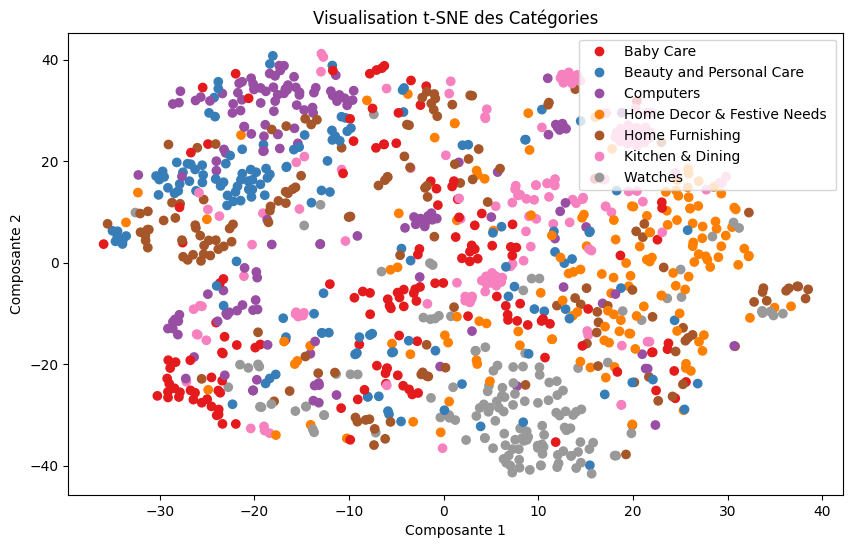

In [136]:
# Création de l'encodeur et transformation des catégories
labelencoder = LabelEncoder()
categorie = labelencoder.fit_transform(data_texte['Category_1'])

# Création du scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='Set1')

# Création de la légende
handles, labels = scatter.legend_elements()
plt.legend(handles, labelencoder.classes_)

# Ajouter des titres et des étiquettes si nécessaire
plt.title('Visualisation t-SNE des Catégories')
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Affichage du plot
plt.show()

L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : 0.16471371400349724


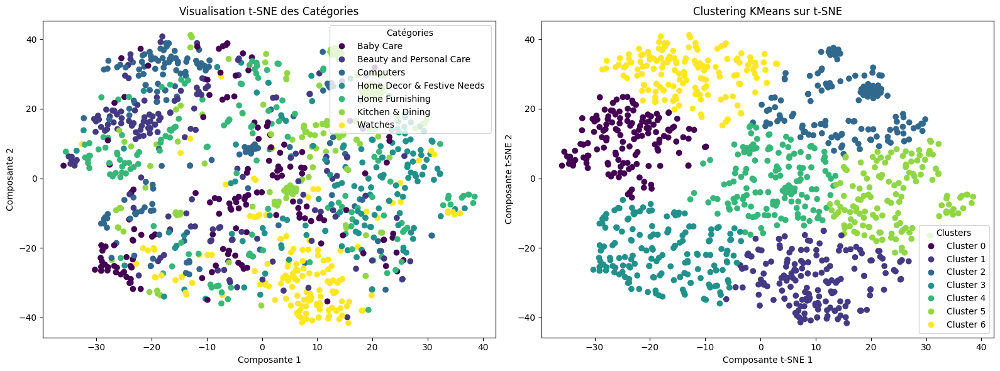

In [137]:
# Appliquer KMeans sur les données t-SNE
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_labels = kmeans.fit_predict(X_tsne)

# Créer une figure avec 2 sous-graphiques côte à côte
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# 1ère visualisation : t-SNE avec les catégories d'origine
scatter_1 = ax[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='viridis')
ax[0].set_title('Visualisation t-SNE des Catégories')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
# Ajouter une légende pour les catégories d'origine
handles_1, labels_1 = scatter_1.legend_elements()
ax[0].legend(handles_1, labelencoder.classes_, title="Catégories")

# 2ème visualisation : Clustering KMeans sur t-SNE
scatter_2 = ax[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
ax[1].set_title('Clustering KMeans sur t-SNE')
ax[1].set_xlabel('Composante t-SNE 1')
ax[1].set_ylabel('Composante t-SNE 2')
# Ajouter une légende pour les clusters
handles_2, labels_2 = scatter_2.legend_elements()
ax[1].legend(handles_2, [f'Cluster {i}' for i in range(7)], title="Clusters")

# Calculer l'ARI entre les étiquettes d'origine (categorie) et les clusters KMeans
ari = adjusted_rand_score(categorie, kmeans_labels)
print(f"L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : {ari}")

# Afficher les deux graphiques côte à côte
plt.tight_layout()
plt.show()

## **Bert**

In [138]:
import torch
from transformers import BertTokenizer, BertModel

# Charger le tokenizer et le modèle BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Fonction pour obtenir les embeddings BERT pour un texte
def encode_with_bert(text, tokenizer, model):
    # Tokeniser le texte
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512)

    # Obtenir les embeddings BERT
    with torch.no_grad():  # Désactiver les gradients
        outputs = model(**inputs)

    # Extraire les embeddings du dernier hidden state de BERT
    last_hidden_state = outputs.last_hidden_state

    # Retourner la moyenne des embeddings (pooling) pour obtenir un vecteur fixe pour chaque texte
    return torch.mean(last_hidden_state, dim=1).squeeze().numpy()

# Appliquer BERT à la colonne 'cleaned_description' du DataFrame
data_texte['bert_embeddings'] = data_texte['description'].apply(lambda x: encode_with_bert(x, tokenizer, model))

# Si tu veux convertir ces vecteurs en DataFrame :
bert_encoded_df = pd.DataFrame(data_texte['bert_embeddings'].tolist())

# Afficher la DataFrame des embeddings BERT
bert_encoded_df.head()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767
0,-0.149666,-0.090556,0.609885,-0.055389,0.537362,-0.019510,-0.020722,0.241571,-0.013054,-0.451505,0.157803,-0.420031,-0.091267,0.495453,-0.216425,0.413215,0.517977,0.098312,-0.278131,0.318773,0.431314,-0.226115,0.078870,0.330158,0.277519,-0.080115,0.029469,0.217704,0.266704,0.029222,0.488266,0.199133,-0.309995,-0.351578,0.176037,-0.295690,-0.191837,-0.186609,-0.222992,0.193398,-0.494760,-0.346041,0.183029,-0.201391,-0.052232,-0.413563,-0.092119,0.323521,0.014633,0.131939,-0.228992,0.104933,-0.132038,-0.109153,0.296784,0.681873,-0.235072,-0.090133,-0.395391,-0.171288,0.065551,-0.219427,0.226385,-0.385877,0.075837,0.313680,0.022036,-0.050604,-0.579304,0.015546,-0.286388,0.070493,0.121678,-0.099370,-0.281891,-0.023004,-0.472421,0.111443,0.372448,-0.028699,-0.143231,0.198750,-0.083850,0.571858,0.062047,0.196999,0.141994,0.308279,-0.214508,0.384536,0.130645,-0.232453,0.321156,0.169150,0.205804,-0.184355,0.268065,0.114403,-0.066298,0.570231,0.227570,0.071110,0.174186,-0.001476,-0.003410,-0.270647,-0.027711,0.204487,-0.115728,0

In [139]:
# La TSNE
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
tsne = TSNE(n_components=2, n_iter=2000, init='random', random_state=42)
X_tsne = tsne.fit_transform(bert_encoded_df)
X_tsne

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


array([[-20.041843 ,   5.843149 ],
       [-15.430355 ,  12.824196 ],
       [-22.909996 ,   6.7806387],
       ...,
       [  8.217475 , -43.99009  ],
       [  8.030509 , -42.830315 ],
       [  7.236012 , -42.105637 ]], dtype=float32)

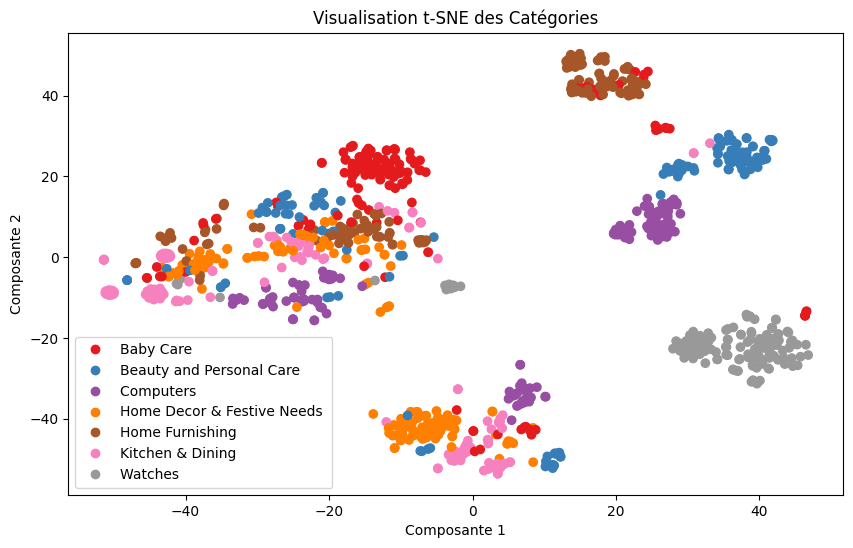

In [140]:
# Création de l'encodeur et transformation des catégories
labelencoder = LabelEncoder()
categorie = labelencoder.fit_transform(data_texte['Category_1'])

# Création du scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='Set1')

# Création de la légende
handles, labels = scatter.legend_elements()
plt.legend(handles, labelencoder.classes_)

# Ajouter des titres et des étiquettes si nécessaire
plt.title('Visualisation t-SNE des Catégories')
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')

# Affichage du plot
plt.show()

L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : 0.30320922614453566


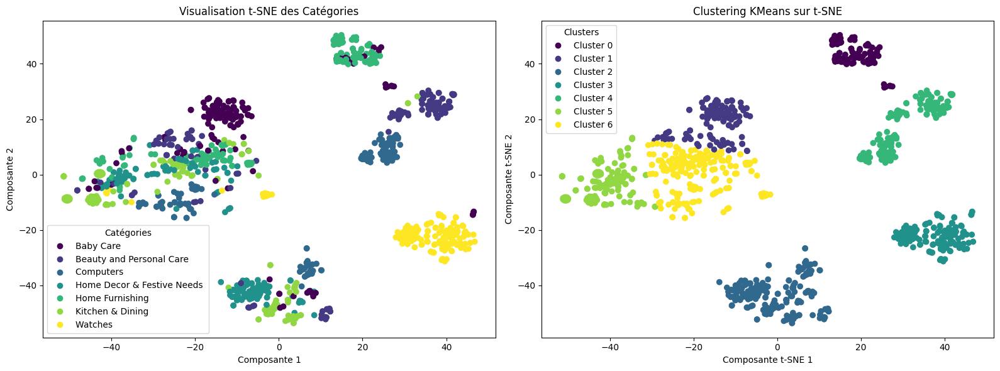

In [141]:
# Appliquer KMeans sur les données t-SNE
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans_labels = kmeans.fit_predict(X_tsne)

# Créer une figure avec 2 sous-graphiques côte à côte
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# 1ère visualisation : t-SNE avec les catégories d'origine
scatter_1 = ax[0].scatter(X_tsne[:, 0], X_tsne[:, 1], c=categorie, cmap='viridis')
ax[0].set_title('Visualisation t-SNE des Catégories')
ax[0].set_xlabel('Composante 1')
ax[0].set_ylabel('Composante 2')
# Ajouter une légende pour les catégories d'origine
handles_1, labels_1 = scatter_1.legend_elements()
ax[0].legend(handles_1, labelencoder.classes_, title="Catégories")

# 2ème visualisation : Clustering KMeans sur t-SNE
scatter_2 = ax[1].scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
ax[1].set_title('Clustering KMeans sur t-SNE')
ax[1].set_xlabel('Composante t-SNE 1')
ax[1].set_ylabel('Composante t-SNE 2')
# Ajouter une légende pour les clusters
handles_2, labels_2 = scatter_2.legend_elements()
ax[1].legend(handles_2, [f'Cluster {i}' for i in range(7)], title="Clusters")

# Calculer l'ARI entre les étiquettes d'origine (categorie) et les clusters KMeans
ari = adjusted_rand_score(categorie, kmeans_labels)
print(f"L'Adjusted Rand Index (ARI) entre les catégories initiales et les clusters est de : {ari}")

# Afficher les deux graphiques côte à côte
plt.tight_layout()
plt.show()

# **Comparaisons des modeles**

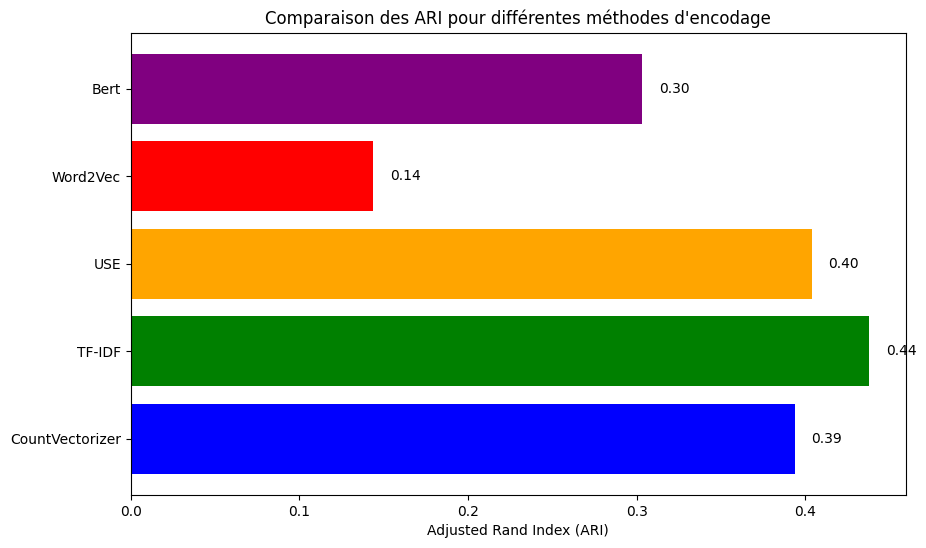

In [142]:
ari_countvectorizer =  0.39357484957661415
ari_tfidf = 0.43762485699732656
ari_use = 0.40367730964733584
ari_word2vec = 0.14375955378012623
ari_bert = 0.30320922614453566

# Créer une liste des méthodes et des ARI correspondants
methods = ['CountVectorizer', 'TF-IDF', 'USE', 'Word2Vec', 'Bert']
ari_scores = [ari_countvectorizer, ari_tfidf, ari_use, ari_word2vec, ari_bert]

# Créer un graphique à barres
plt.figure(figsize=(10, 6))
plt.barh(methods, ari_scores, color=['blue', 'green', 'orange', 'red', 'purple'])

# Ajouter des labels et un titre
plt.xlabel('Adjusted Rand Index (ARI)')
plt.title('Comparaison des ARI pour différentes méthodes d\'encodage')

# Afficher la valeur de l'ARI sur chaque barre
for index, value in enumerate(ari_scores):
    plt.text(value + 0.01, index, f'{value:.2f}', va='center')

# Afficher le graphique
plt.show()

In [143]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # SIFT fonctionne en niveau de gris
        if img is not None:
            images.append(img)
    return images

images = load_images_from_folder(file_path)

NameError: name 'file_path' is not defined

In [ ]:
sift = cv2.SIFT_create()

def extract_sift_features(images):
    all_descriptors = []
    for img in images:
        keypoints, descriptors = sift.detectAndCompute(img, None)
        if descriptors is not None:
            all_descriptors.append(descriptors)
    return all_descriptors


In [ ]:
# Extraire les descripteurs SIFT pour toutes les images
sift_descriptors = extract_sift_features(images)

In [ ]:
# Combiner tous les descripteurs SIFT en une seule matrice
sift_descriptors_combined = np.vstack(sift_descriptors)

# Appliquer k-means pour regrouper les descripteurs en "visuel words"
from sklearn.cluster import KMeans

In [ ]:
# Définir le nombre de clusters (nombre de mots visuels)
num_clusters = 400  # À ajuster selon le nombre de mots que vous voulez
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
kmeans.fit(sift_descriptors_combined)

In [ ]:
def image_to_bow(descriptors, kmeans):
    # Attribuer les descripteurs SIFT de l'image à des clusters
    clusters = kmeans.predict(descriptors)
    # Créer un histogramme des "mots visuels"
    histogram, _ = np.histogram(clusters, bins=np.arange(0, num_clusters + 1))
    return histogram

# Convertir toutes les images en représentations BoVW
bovw_representations = []
for descriptors in sift_descriptors:
    if descriptors is not None:
        bovw_histogram = image_to_bow(descriptors, kmeans)
        bovw_representations.append(bovw_histogram)

bovw_representations = np.array(bovw_representations)

In [ ]:
bovw_representations

*a la sortie de ce bout de code on fera la Tsne et ARI*

In [ ]:
# Apply t-SNE to the BoVW representations
tsne = TSNE(n_components=2, random_state=0)
bovw_tsne = tsne.fit_transform(bovw_representations)

# Create a scatter plot of the t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(bovw_tsne[:, 0], bovw_tsne[:, 1], marker='o', alpha=0.7)
plt.title('t-SNE Visualization of Bag of Visual Words Representations')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.grid(True)
plt.show()

In [ ]:
#recurere les 10 premier produit, python request, il faut garder son id, le label, la categorie et le exporter en fichier csv

https://developer.edamam.com/food-database-api

In [ ]:
https://openclassrooms.com/fr/users/9056820/paths/793/projects/1503/mission---realisez-une-classification-supervisee-d%E2%80%99images

In [ ]:
!pip install requests
